## WINE QUALITY PREDICTION 
 #### VAISHALI SHARMA

In [8]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import warnings
warnings.filterwarnings('ignore')

In [9]:
df = pd.read_csv('C:\\Users\\vaish\\Desktop\\winequality_white.csv')
df.head(5)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4898 entries, 0 to 4897
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         4898 non-null   float64
 1   volatile acidity      4898 non-null   float64
 2   citric acid           4898 non-null   float64
 3   residual sugar        4898 non-null   float64
 4   chlorides             4898 non-null   float64
 5   free sulfur dioxide   4898 non-null   float64
 6   total sulfur dioxide  4898 non-null   float64
 7   density               4898 non-null   float64
 8   pH                    4898 non-null   float64
 9   sulphates             4898 non-null   float64
 10  alcohol               4898 non-null   float64
 11  quality               4898 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 459.3 KB


In [40]:
## Target variable
df.quality.value_counts()

6    2198
5    1457
7     880
8     175
4     163
3      20
9       5
Name: quality, dtype: int64

In [41]:
df.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality'],
      dtype='object')

## 1. EDA

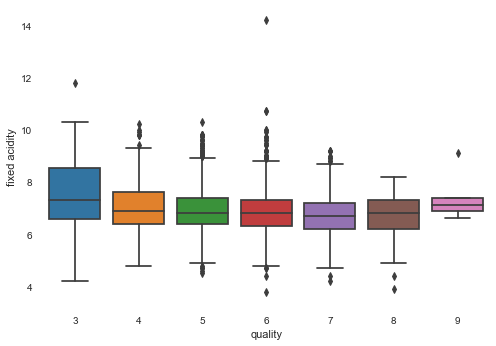

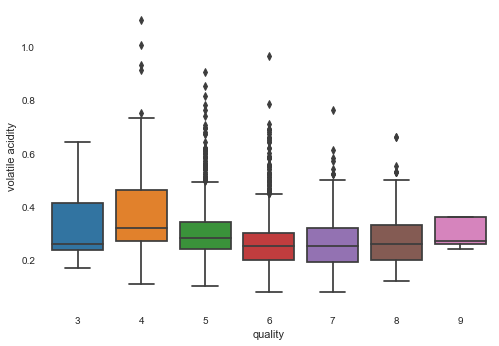

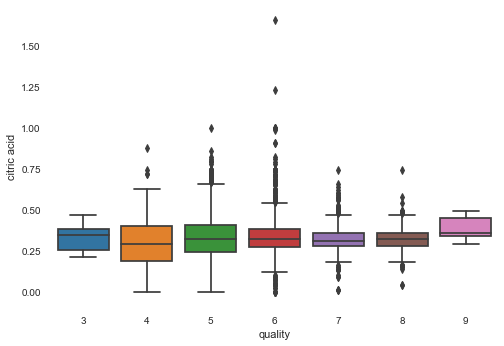

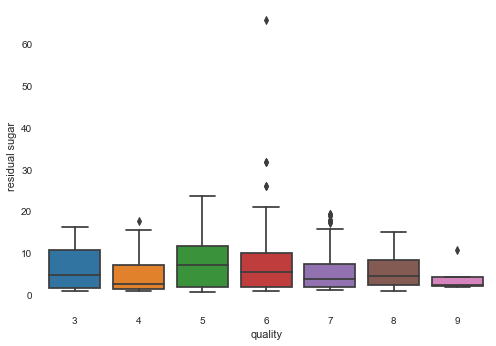

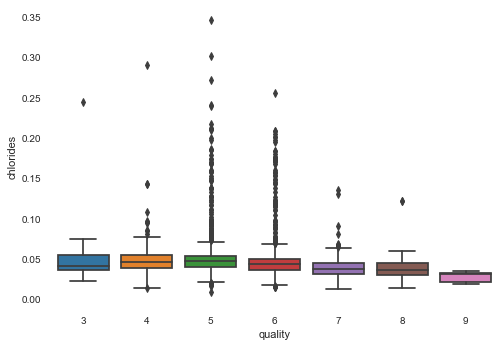

...

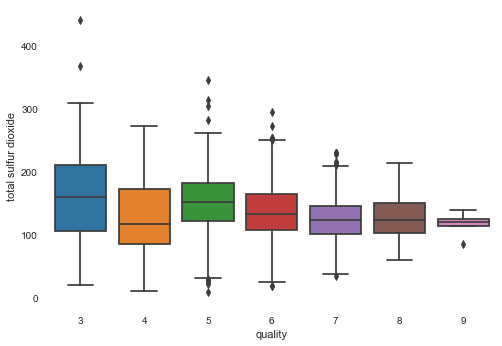

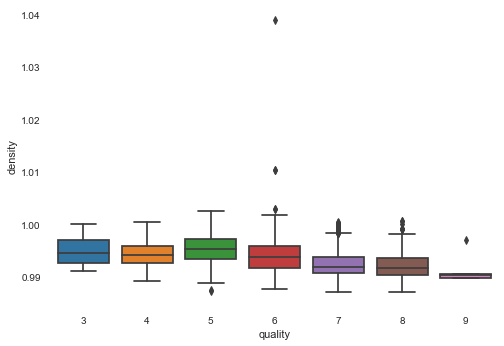

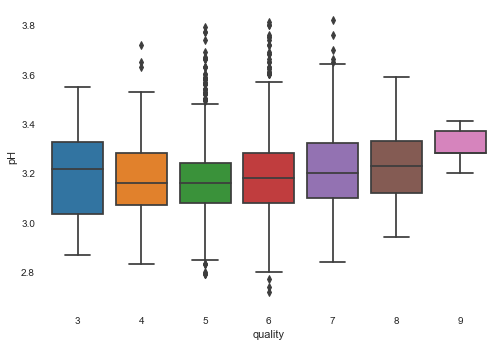

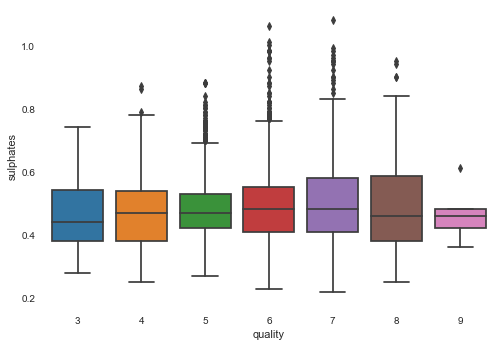

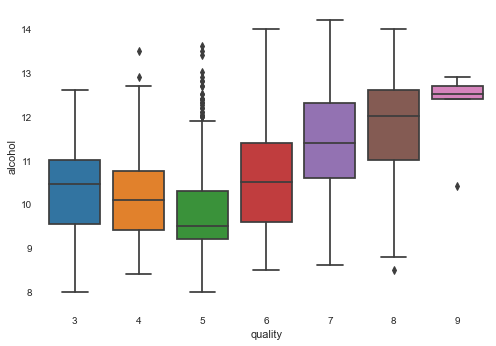

In [28]:
#a. boxplot
for i in df.drop('quality',axis=1).columns:
    sns.boxplot(df.quality,df[i])
    plt.show()
    

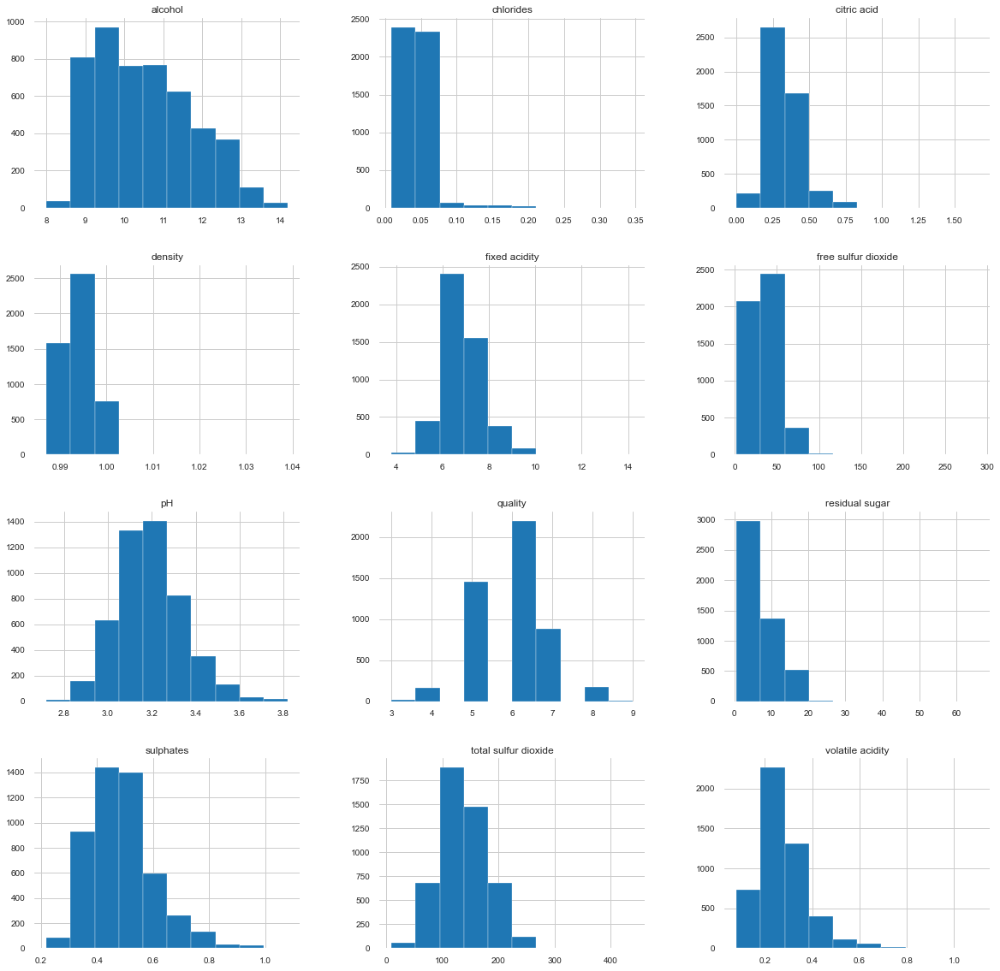

In [29]:
## Histogram
df.hist(bins=10, figsize=(20,20))
plt.show()

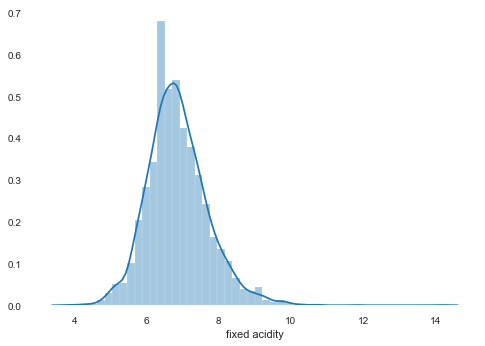

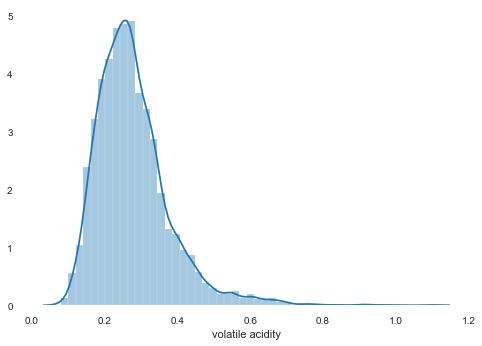

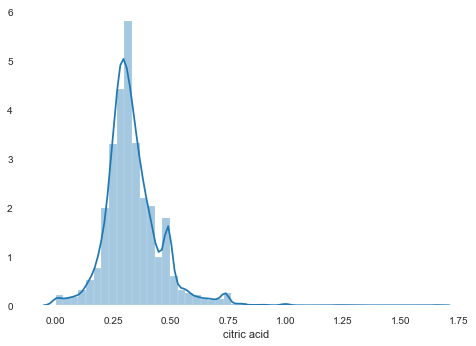

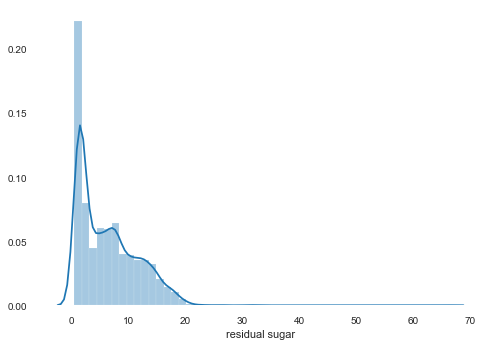

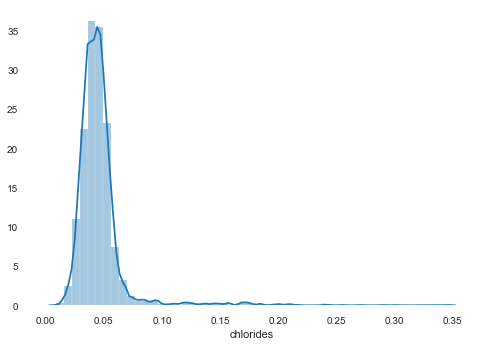

...

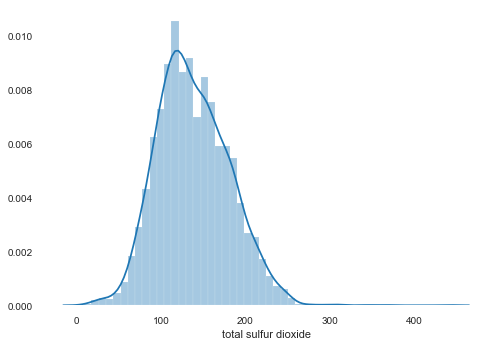

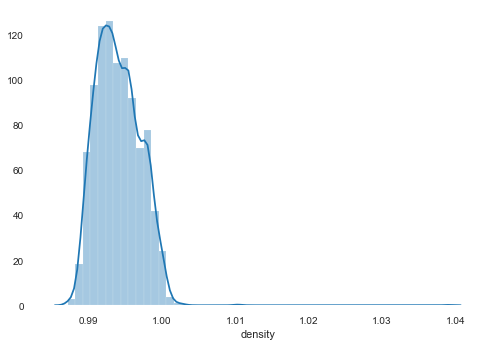

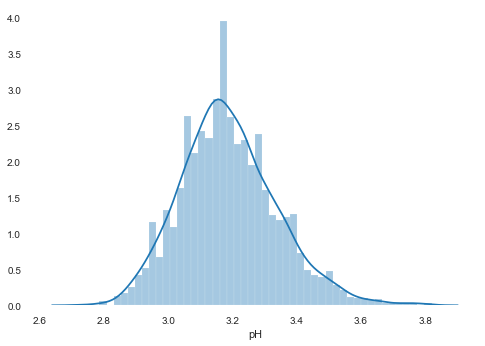

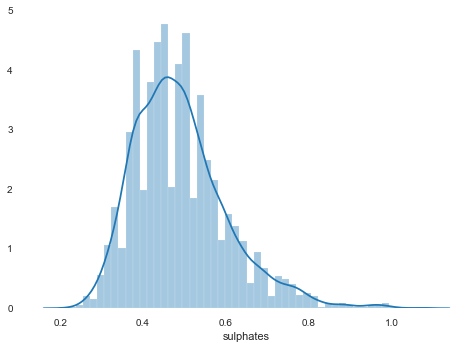

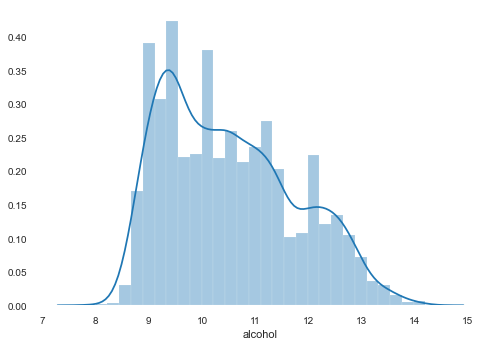

In [30]:
## Distribution plot
for i in df.drop(['quality'], axis=1).columns:
    sns.distplot(df[i])
    plt.show()

In [31]:
## Aggregration of all column values
df.select_dtypes(include=['float64']).describe()


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
count,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000
mean,6.854788,0.278241,0.334192,6.391415,0.045772,35.308085,138.360657,0.994027,3.188267,0.489847,10.514267
std,0.843868,0.100795,0.121020,5.072058,0.021848,17.007137,42.498065,0.002991,0.151001,0.114126,1.230621
min,3.800000,0.080000,0.000000,0.600000,0.009000,2.000000,9.000000,0.987110,2.720000,0.220000,8.000000
25%,6.300000,0.210000,0.270000,1.700000,0.036000,23.000000,108.000000,0.991723,3.090000,0.410000,9.500000
50%,6.800000,0.260000,0.320000,5.200000,0.043000,34.000000,134.000000,0.993740,3.180000,0.470000,10.400000
75%,7.300000,0.320000,0.390000,9.900000,0.050000,46.000000,167.000000,0.996100,3.280000,0.550000,11.400000
max,14.200000,1.100000,1.660000,65.800000,0.346000,289.000000,440.000000,1.038980,3.820000,1.080000,14.200000


In [32]:
df.select_dtypes(include=['float64']).sum()


fixed acidity            33574.75000
volatile acidity          1362.82500
citric acid               1636.87000
residual sugar           31305.15000
chlorides                  224.19300
free sulfur dioxide     172939.00000
total sulfur dioxide    677690.50000
density                   4868.74609
pH                       15616.13000
sulphates                 2399.27000
alcohol                  51498.88000
dtype: float64

In [33]:
## Unique Values across all columns
for i in df.select_dtypes(include=['float64']).columns:
    print('unique column name:',i)
    print(df[i].unique())

unique column name: fixed acidity
[ 7.    6.3   8.1   7.2   6.2   8.6   7.9   6.6   8.3   7.4   6.5   6.4
  6.8   7.6   6.9   8.5   5.8   7.3   6.7   6.    7.1   6.1   7.5   9.8
  5.5   5.9   7.8   5.7   8.2   5.6   5.2   8.4  10.2   7.7   5.3   5.4
  9.1   5.    8.   10.    5.1   9.2   9.    8.8   8.7   4.8  10.3   9.4
  9.6   9.3   8.9   9.7  10.7  14.2   9.9   9.5  11.8   4.6   6.15  4.5
  7.15  6.45  4.2   4.9   4.7   3.8   4.4   3.9 ]
unique column name: volatile acidity
[0.27  0.3   0.28  0.23  0.32  0.22  0.18  0.16  0.42  0.17  0.48  0.66
 0.34  0.31  0.26  0.67  0.25  0.24  0.14  0.12  0.39  0.33  0.45  0.46
 0.19  0.2   0.21  0.38  0.47  0.35  0.54  0.43  0.44  0.265 0.36  0.305
 0.13  0.41  0.485 0.425 0.37  0.255 0.595 0.29  0.53  0.15  0.57  0.4
 0.245 0.685 0.495 0.64  0.52  0.115 0.58  0.585 0.59  0.6   0.55  0.125
 0.1   0.145 0.335 0.365 0.905 0.49  0.155 0.51  0.62  0.345 0.475 0.56
 0.235 0.105 0.5   0.11  0.225 0.395 0.655 0.205 0.415 0.705 0.08  0.68
 0.275 0.61  0

In [34]:
## drop duplicates
print('original number of rows in data frame:',df.shape[0])
print('number of rows after dropping duplicates:',df.drop_duplicates().shape[0])

original number of rows in data frame: 4898
number of rows after dropping duplicates: 3961


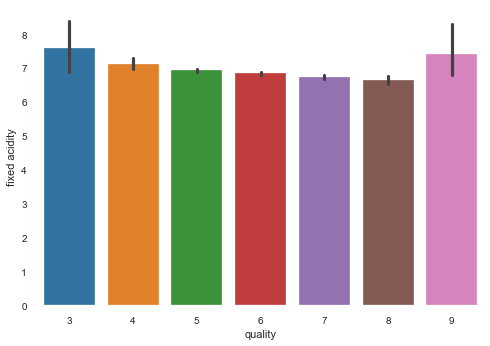

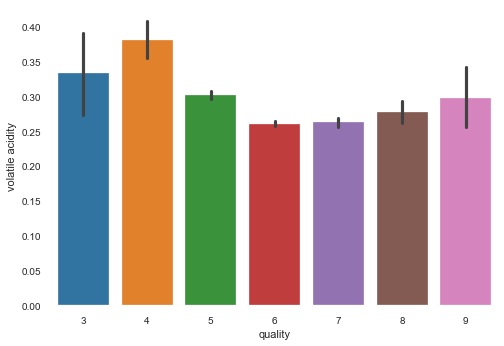

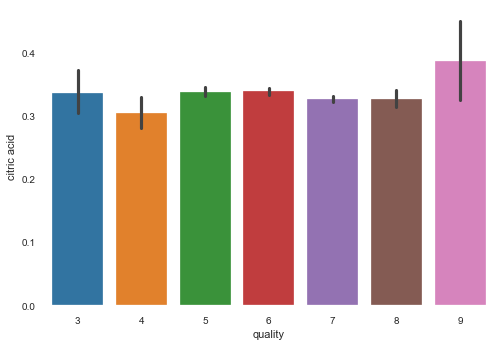

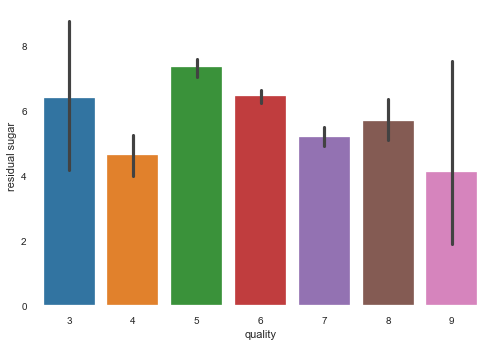

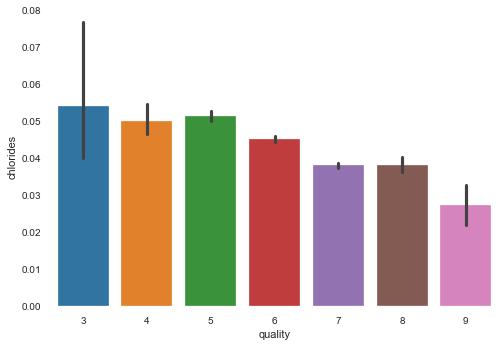

...

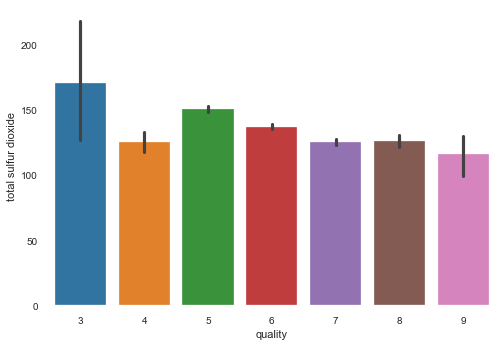

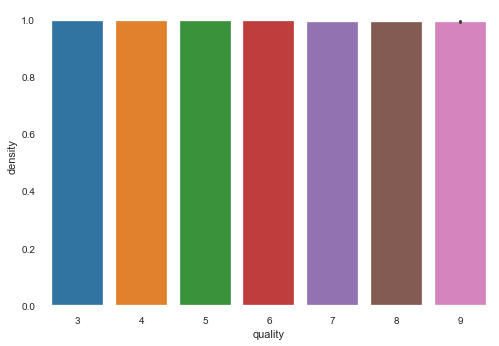

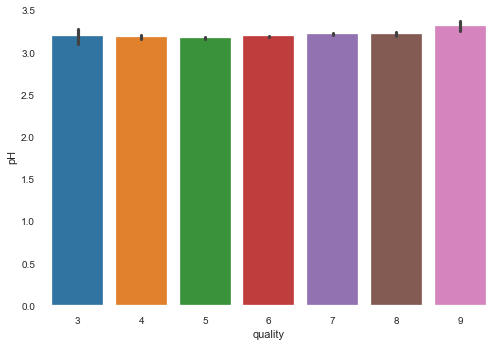

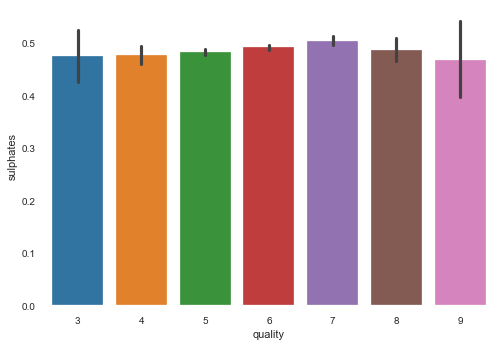

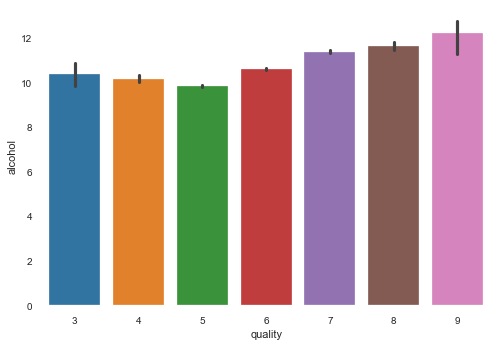

In [35]:
## Bar plot
for i in df.drop('quality',axis=1).columns:
    sns.barplot(df.quality,df[i])
    plt.show()

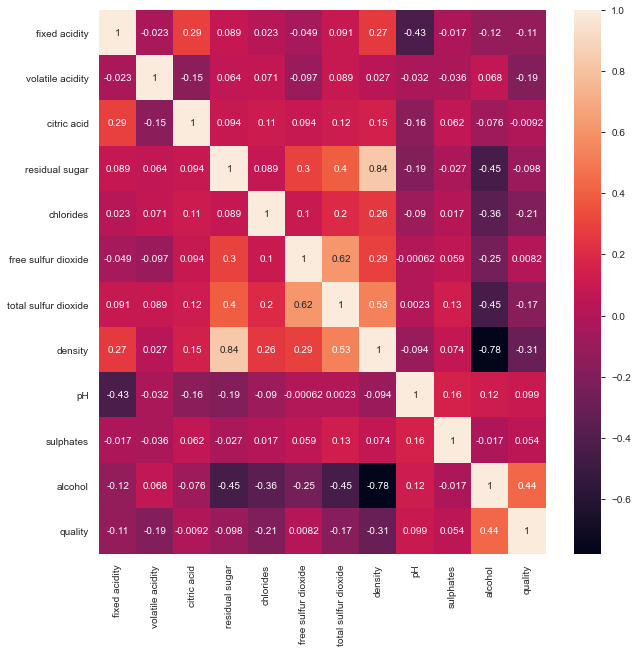

In [36]:
plt.figure(figsize=(10,10))
sns.heatmap(df.corr(),annot=True)

### There are the three pairs of features having a high correlation i.e residual sugar and density, alcohol and density and total sulfur dioxide and free sulfur dioxide

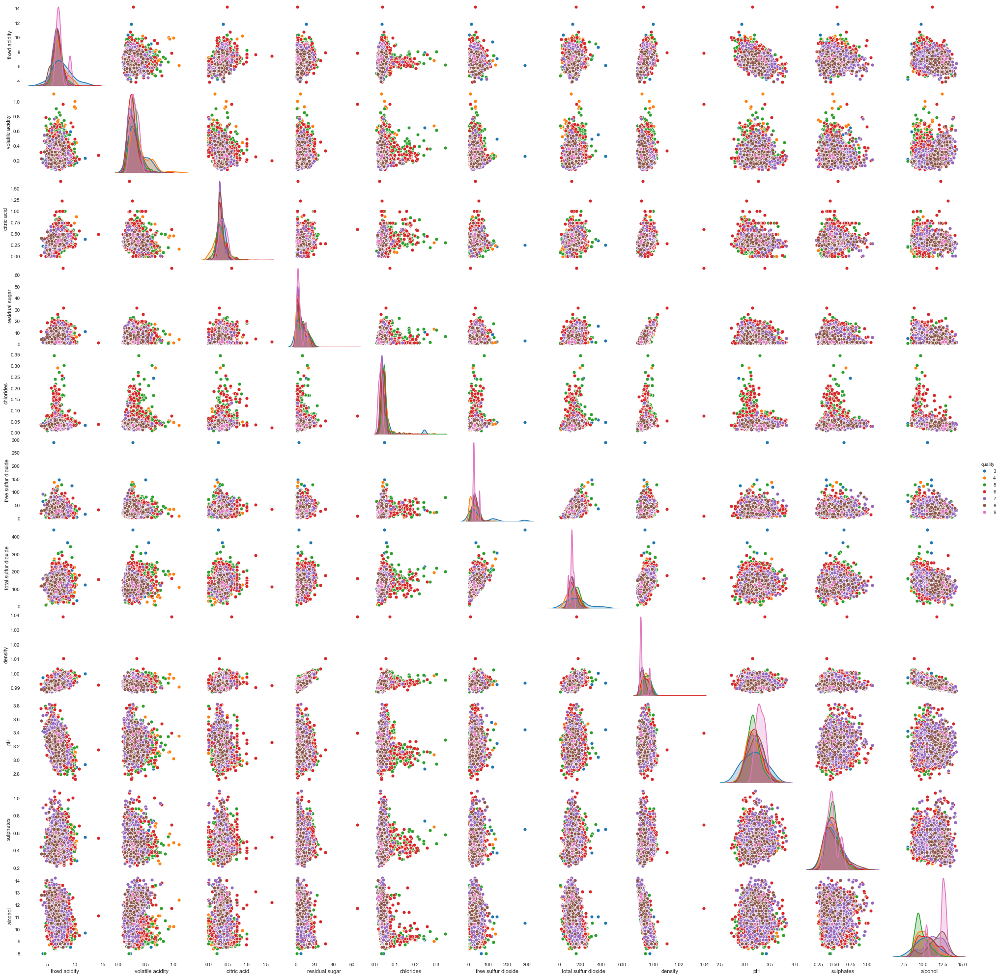

In [58]:
sns.pairplot(df,hue='quality')

In [42]:
from pandas_profiling import ProfileReport
profile = ProfileReport(df)
profile

In [21]:
dff_nan.isnull().sum(axis=0) 

fixed acidity            46
volatile acidity         81
citric acid              85
residual sugar            9
chlorides               102
free sulfur dioxide      32
total sulfur dioxide     12
density                   3
pH                       32
sulphates                48
alcohol                   0
dtype: int64

## Replace outliers with Nulls (if you find it essential) and replace all the nulls with respective
approach of central tendencies (Mean/Median/Mode).

In [54]:
dff_nan = dff_nan.fillna(dff_nan.mean())

In [43]:
dff_nan.isnull().sum(axis=0) 

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
dtype: int64

In [44]:
## Calculate Z-Score

In [45]:
from scipy import stats
import numpy as np
z = np.abs(stats.zscore(dff_nan))
print(z)

[[0.21489372 0.01794977 0.32468905 ... 1.27802927 0.33701066 1.39315246]
 [0.67415559 0.33281714 0.13215182 ... 0.7945197  0.04198226 0.82427568]
 [1.61197122 0.09897253 0.7097635  ... 0.51817984 0.43175889 0.33666701]
 ...
 [0.4201415  0.36871668 1.31187737 ... 1.34711424 0.24226243 0.90554379]
 [1.69021196 0.21589484 0.25292263 ... 1.07085956 1.00024825 1.85757201]
 [1.05517673 0.7194836  0.51722628 ... 0.51817984 1.56873762 1.04489089]]


In [48]:
threshold = 3
print(np.where(z > 3))

(array([  35,   60,   79,   96,   99,  110,  115,  115,  124,  137,  141,
        188,  202,  208,  267,  273,  297,  300,  302,  311,  366,  387,
        392,  433,  433,  459,  465,  478,  506,  507,  509,  541,  549,
        551,  555,  570,  580,  612,  613,  614,  615,  620,  621,  626,
        626,  662,  662,  681,  752,  754,  778,  780,  782,  817,  819,
        847,  862,  864,  868,  870,  870,  879,  890,  970, 1024, 1027,
       1057, 1062, 1074, 1085, 1104, 1109, 1125, 1138, 1141, 1142, 1152,
       1185, 1210, 1214, 1249, 1256, 1261, 1262, 1278, 1308, 1308, 1313,
       1323, 1332, 1339, 1341, 1342, 1349, 1350, 1382, 1417, 1420, 1436,
       1455, 1482, 1482, 1505, 1541, 1575, 1586, 1590, 1596, 1596, 1604,
       1674, 1718, 1730, 1732, 1817, 1835, 1848, 1855, 1859, 1886, 1896,
       1897, 1905, 1930, 1932, 1933, 1933, 1936, 1937, 1972, 1973, 1974,
       1995, 1997, 1998, 2006, 2014, 2017, 2057, 2099, 2104, 2139, 2148,
       2162, 2191, 2211, 2242, 2250, 2321, 2365, 2

## We still have outliers based on your defination of outliers

## Clean the data with formatting issues if any. (converting datatypes, replacing dollars, etc.)

### There are no formatting issues with this data, because we have all the numerical values.

## MACHINE LEARNING PREDICTION MODEL

In [23]:
#8 Classification ML
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score, mean_absolute_error,mean_squared_error,r2_score
from sklearn.model_selection import cross_val_score, KFold
from sklearn import metrics
from sklearn.metrics import roc_auc_score

In [26]:
import numpy as np

def mean_absolute_percentage_error(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [15]:
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
X = df.drop('quality',axis=1)
y = df[['quality']]

In [16]:
df.quality.unique()

array([6, 5, 7, 8, 4, 3, 9], dtype=int64)

In [17]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size = 0.3,random_state=42)


In [18]:
knn = KNeighborsClassifier(n_neighbors=3, weights='distance')
knn.fit(X_train,y_train)
y_pred = knn.predict(X_test)

In [19]:
print('F1-Score :',f1_score(y_test,y_pred,average = 'weighted'))
print('Report:\n',classification_report(y_test, y_pred))
print('confusion Matrix:\n',confusion_matrix(y_pred,y_test))

F1-Score : 0.575543064851357
Report:
               precision    recall  f1-score   support

           3       0.20      0.14      0.17         7
           4       0.25      0.17      0.21        40
           5       0.57      0.58      0.58       426
           6       0.61      0.66      0.63       668
           7       0.56      0.50      0.53       280
           8       0.45      0.39      0.42        49
           9       0.00      0.00      0.00         0

    accuracy                           0.58      1470
   macro avg       0.38      0.35      0.36      1470
weighted avg       0.57      0.58      0.58      1470

confusion Matrix:
 [[  1   2   2   0   0   0   0]
 [  0   7   8   8   5   0   0]
 [  3  18 246 135  24   2   0]
 [  2  10 144 438 102  19   0]
 [  1   3  22  76 140   9   0]
 [  0   0   4  10   9  19   0]
 [  0   0   0   1   0   0   0]]


In [20]:
print('cross validation:',cross_val_score(knn, X, y, cv=5).mean())

cross validation: 0.39526630672698093


### As a Regressor Problem

In [22]:
knn = KNeighborsRegressor(n_neighbors=3, weights='distance')
knn.fit(X_train,y_train)
y_pred = knn.predict(X_test)

In [27]:
print('R2-Score :',r2_score(y_test,y_pred))
print('MSE :',mean_squared_error(y_test,y_pred))
print('MAE :',mean_absolute_error(y_test,y_pred))
print('MAPE :',mean_absolute_percentage_error(y_test,y_pred))

R2-Score : 0.2656548795551712
MSE : 0.5544541843290484
MAE : 0.4907984087394926
MAPE : 8.67808971908607


In [28]:
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from xgboost import XGBClassifier, XGBRegressor
from sklearn.ensemble import GradientBoostingClassifier, GradientBoostingRegressor

#### Classifier

In [38]:
models = {'RandomForestClassifier':RandomForestClassifier(),
          'GradientBoosingClassifier':GradientBoostingClassifier(),
          'XGBoost':XGBClassifier()}
for model_name, model in models.items():
    model.fit(X_train, y_train)
    pred = model.predict(X_test)
    print('\nF1 Score For', model_name,'>>',f1_score(y_test,pred,average = 'weighted'))
    print('cross validation for',model_name,'::>',cross_val_score(model, X, y, cv=5).mean())


F1 Score For RandomForestClassifier >> 0.663739670974846
cross validation for RandomForestClassifier ::> 0.5220512392904046

F1 Score For GradientBoosingClassifier >> 0.570374241843892
cross validation for GradientBoosingClassifier ::> 0.5132734360342707

F1 Score For XGBoost >> 0.6486503096003519
cross validation for XGBoost ::> 0.5112292843593005


### Regression

In [32]:
models = {'RandomForestRegressor':RandomForestRegressor(),
          'GradientBoostingRegressor':GradientBoostingRegressor(),
          'XGBoost_regressor':XGBRegressor()}
for model_name, model in models.items():
    model.fit(X_train, y_train)
    pred = model.predict(X_test)
    print('\nR2 For', model_name,'>>',r2_score(y_test,pred))
    print('MSE :',mean_squared_error(y_test,y_pred))
    print('MAE :',mean_absolute_error(y_test,y_pred))
    print('MAPE :',mean_absolute_percentage_error(y_test,y_pred))
    print('cross validation for',model_name,'::>',cross_val_score(model, X, y, cv=5).mean())


R2 For RandomForestRegressor >> 0.5187418600360765
MSE : 0.44081632653061226
MAE : 0.3578231292517007
MAPE : 14.444995526555296
cross validation for RandomForestRegressor ::> 0.306008551185794

R2 For GradientBoostingRegressor >> 0.3981726127996186
MSE : 0.44081632653061226
MAE : 0.3578231292517007
MAPE : 14.444995526555296
cross validation for GradientBoostingRegressor ::> 0.30719669160155355

R2 For XGBoost_regressor >> 0.4548941426966223
MSE : 0.44081632653061226
MAE : 0.3578231292517007
MAPE : 14.444995526555296
cross validation for XGBoost_regressor ::> 0.18644999358151376


### Done this prediction in both the ways as the target variable i.e the quality is decided into categories as 6,5,4 and did this as a regression problem as the target variable is numerical in nature hence in classification model the best model for prediction is random forest due to its best accuracy and f1 score . The best regression model is also random forest due to high R2 score.

## HYPERTUNNING

In [31]:
from sklearn.model_selection import GridSearchCV

models = {'GradientBoosingClassifier':GradientBoostingClassifier(),
          'XGBoost':XGBClassifier(),
          'RandomForestClassifier':RandomForestClassifier(),}
params = {
            'max_depth': [50, 70, 90],
            'n_estimators': [40, 50, 100],
}
for model_name, model in models.items():
    grid = GridSearchCV(model, params)
    grid.fit(X_train,y_train)
    y_pred = grid.best_estimator_.predict(X_test)
    print('Scores after HypterParameterTuninig')
    print(model_name,' F1-Score is >> :',f1_score(y_test,y_pred,average = 'weighted'))

Scores after HypterParameterTuninig
GradientBoosingClassifier  F1-Score is >> : 0.6077369047939825
Scores after HypterParameterTuninig
XGBoost  F1-Score is >> : 0.6473792363513492
Scores after HypterParameterTuninig
RandomForestClassifier  F1-Score is >> : 0.6682977801959378


In [33]:
from sklearn.model_selection import GridSearchCV

models = {'GradientBoosingRegressor':GradientBoostingRegressor(),
          'XGBoost':XGBRegressor(),
          'RandomForestRegressor':RandomForestRegressor(),}
params = {
            'max_depth': [50, 70, 90],
            'n_estimators': [40, 50, 100],
}
for model_name, model in models.items():
    grid = GridSearchCV(model, params)
    grid.fit(X_train,y_train)
    y_pred = grid.best_estimator_.predict(X_test)
    print('Scores after HypterParameterTuninig')
    print(model_name,' r2-Score is >> :',r2_score(y_test,y_pred))

Scores after HypterParameterTuninig
GradientBoosingRegressor  r2-Score is >> : 0.1775995152903873
Scores after HypterParameterTuninig
XGBoost  r2-Score is >> : 0.4556579421424214
Scores after HypterParameterTuninig
RandomForestRegressor  r2-Score is >> : 0.5222706550646046


### Independent feature Analysis

In [34]:
#import library for VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor

def calc_vif(X):

    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

    return(vif)


In [35]:
X = df.iloc[:,:-1]
calc_vif(X)


,variables,VIF
0,fixed acidity,92.861483
1,volatile acidity,9.730569
2,citric acid,10.007114
3,residual sugar,3.830272
4,chlorides,6.497448
5,free sulfur dioxide,9.261556
6,total sulfur dioxide,24.980802
7,density,1056.497431
8,pH,609.861725
9,sulphates,20.527123


In [38]:
pxx = calc_vif(X)
col = pxx[pxx['VIF'] < 10]['variables'].to_list()

In [40]:
X_train,X_test,y_train,y_test = train_test_split(X[col],y,test_size = 0.3,random_state=42)
knn = KNeighborsClassifier(n_neighbors=3, weights='distance')
knn.fit(X_train,y_train)
y_pred = knn.predict(X_test)

print('F1-Score :',f1_score(y_test,y_pred,average = 'weighted'))
print('Report:\n',classification_report(y_test, y_pred))
print('confusion Matrix:\n',confusion_matrix(y_pred,y_test))

F1-Score : 0.5532379782327586
Report:
               precision    recall  f1-score   support

           3       0.40      0.29      0.33         7
           4       0.16      0.12      0.14        40
           5       0.54      0.54      0.54       426
           6       0.62      0.66      0.64       668
           7       0.48      0.45      0.47       280
           8       0.47      0.37      0.41        49
           9       0.00      0.00      0.00         0

    accuracy                           0.56      1470
   macro avg       0.38      0.35      0.36      1470
weighted avg       0.55      0.56      0.55      1470

confusion Matrix:
 [[  2   2   1   0   0   0   0]
 [  0   5  11  11   3   1   0]
 [  3  14 229 123  51   8   0]
 [  2  17 140 438  93  16   0]
 [  0   1  40  87 126   6   0]
 [  0   1   5   8   6  18   0]
 [  0   0   0   1   1   0   0]]


In [41]:
models = {'RandomForestClassifier':RandomForestClassifier(),
          'GradientBoosingClassifier':GradientBoostingClassifier(),
          'XGBoost':XGBClassifier()}
for model_name, model in models.items():
    model.fit(X_train, y_train)
    pred = model.predict(X_test)
    print('\nF1 Score For', model_name,'>>',f1_score(y_test,pred,average = 'weighted'))
    print('cross validation for',model_name,'::>',cross_val_score(model, X, y, cv=5).mean())


F1 Score For RandomForestClassifier >> 0.6174859382252784
cross validation for RandomForestClassifier ::> 0.5267492860269746

F1 Score For GradientBoosingClassifier >> 0.5111632137789665
cross validation for GradientBoosingClassifier ::> 0.5134775176669237

F1 Score For XGBoost >> 0.5981904069191837
cross validation for XGBoost ::> 0.5112292843593005
